<h1 style="text-align:center; color:#2c3e50;">RANSOMWARES DETECTION</h1>

<h3 style="text-align:center; color:#34495e;">
par : AMINE MIMIS
</h3>


# 🟢 Partie 1 : Visualisations

In [ ]:
# 1. Importation des bibliothèques nécessaires
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn 

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression


In [ ]:
#  2. Chargement du dataset

df = pd.read_csv('C:/Users/hp/Downloads/data_dialna.csv', sep=';')

In [ ]:
#  3. Aperçu des données
print("Aperçu des données :")
display(df.head())

Aperçu des données :


,Sample_Type,bind,CertControlStore,CertOpenStore,closesocket,CoCreateInstance,CoCreateInstanceEx,CoGetClassObject,CoInitializeEx,CoInitializeSecurity,...,HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer\,HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Internet Settings\,HKEY_LOCAL_MACHINE\Software\Microsoft\Windows\CurrentVersion\Internet Settings\,HKEY_LOCAL_MACHINE\SOFTWARE\MICROSOFT\Cryptography\.1,HKEY_LOCAL_MACHINE\SYSTEM\ControlSet001\services\crypt32\,HKEY_LOCAL_MACHINE\SYSTEM\ControlSet001\services\Tcpip\Parameters\,HKEY_LOCAL_MACHINE\Software\Microsoft\Rpc\,HKEY_CURRENT_USER\Software\Microsoft\RestartManager,HKEY_LOCAL_MACHINE\SYSTEM\Setup\OOBEInProgress,HKEY_LOCAL_MACHINE\SYSTEM\Setup\SystemSetupInProgress
0,G,0,0,0,0,0,0,0,1,0,...,18,0,0,0,0,0,0,0,0,0
1,G,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,G,0,13,56,0,0,3,0,28,2,...,26,54,0,148,54,18,0,0,0,3
3,G,0,0,0,0,0,0,0,1,0,...,18,0,0,0,0,0,0,0,0,0
4,G,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


C:\Users\hp\AppData\Local\Temp\ipykernel_38684\3526316497.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Sample_Type', palette='mako')


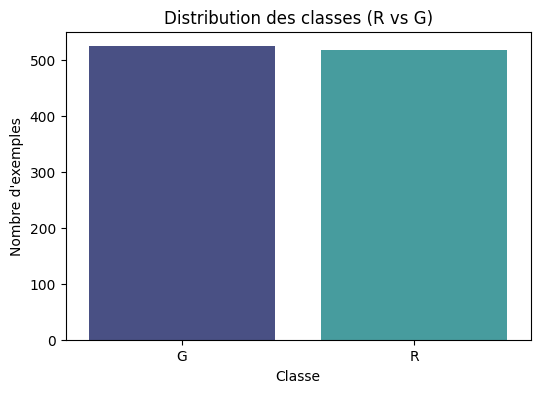

In [ ]:
#  4. Distribution des types (Ransomware vs Goodware)
plt.figure(figsize=(6,4))
sns.countplot(data=df, x='Sample_Type', palette='mako')
plt.title("Distribution des classes (R vs G)")
plt.xlabel("Classe")
plt.ylabel("Nombre d'exemples")
plt.show()

In [8]:
#  5. Nettoyage de base
print("Valeurs manquantes :")
print(df.isnull().sum())

Valeurs manquantes :
Sample_Type                                                           0
bind                                                                  0
CertControlStore                                                      0
CertOpenStore                                                         0
closesocket                                                           0
                                                                     ..
HKEY_LOCAL_MACHINE\SYSTEM\ControlSet001\services\Tcpip\Parameters\    0
HKEY_LOCAL_MACHINE\Software\Microsoft\Rpc\                            0
HKEY_CURRENT_USER\Software\Microsoft\RestartManager                   0
HKEY_LOCAL_MACHINE\SYSTEM\Setup\OOBEInProgress                        0
HKEY_LOCAL_MACHINE\SYSTEM\Setup\SystemSetupInProgress                 0
Length: 248, dtype: int64


In [13]:
#  6. Séparation des features et du label
X = df.drop(columns=['Sample_Type'])
y = df['Sample_Type'].map({'R': 1, 'G': 0})  # Ransomware = 1, Goodware = 0

In [14]:
#  7. Normalisation
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
#  8. Division du dataset
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [ ]:
# 9.Création et entraînement du modèle Random Forest
modele_rf = RandomForestClassifier(n_estimators=100, random_state=42)
modele_rf.fit(X_train, y_train)

# Prédictions
y_pred_rf = modele_rf.predict(X_test)

# Évaluation du modèle
print("✅ Résultats du modèle Random Forest :")
print(confusion_matrix(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))


✅ Résultats du modèle Random Forest :
[[107   5]
 [ 14  83]]
              precision    recall  f1-score   support

           0       0.88      0.96      0.92       112
           1       0.94      0.86      0.90        97

    accuracy                           0.91       209
   macro avg       0.91      0.91      0.91       209
weighted avg       0.91      0.91      0.91       209



In [19]:
# 10.Création et entraînement du modèle de régression logistique
modele_lr = LogisticRegression(max_iter=1000)
modele_lr.fit(X_train, y_train)

# Prédictions
y_pred_lr = modele_lr.predict(X_test)

# Évaluation du modèle
print("✅ Résultats du modèle Régression Logistique :")
print(confusion_matrix(y_test, y_pred_lr))
print(classification_report(y_test, y_pred_lr))


✅ Résultats du modèle Régression Logistique :
[[102  10]
 [ 38  59]]
              precision    recall  f1-score   support

           0       0.73      0.91      0.81       112
           1       0.86      0.61      0.71        97

    accuracy                           0.77       209
   macro avg       0.79      0.76      0.76       209
weighted avg       0.79      0.77      0.76       209



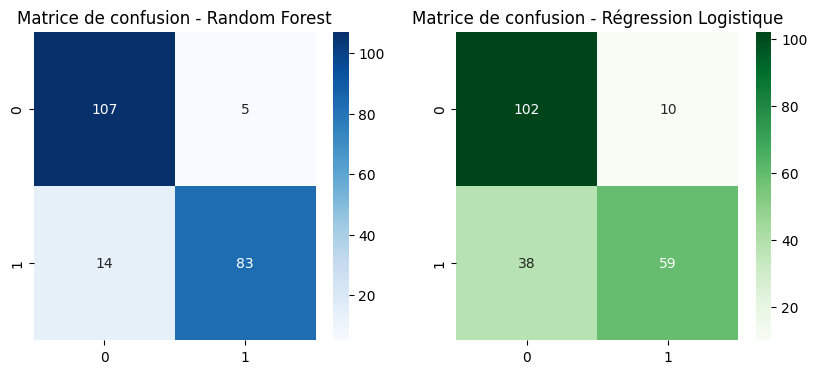

In [20]:
# 10.Visualisation des matrices de confusion pour les deux modèles
plt.figure(figsize=(10,4))

# Matrice de confusion pour Random Forest
plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_test, y_pred_rf), annot=True, fmt='d', cmap='Blues')
plt.title("Matrice de confusion - Random Forest")

# Matrice de confusion pour Régression Logistique
plt.subplot(1, 2, 2)
sns.heatmap(confusion_matrix(y_test, y_pred_lr), annot=True, fmt='d', cmap='Greens')
plt.title("Matrice de confusion - Régression Logistique")

plt.show()


C:\Users\hp\AppData\Local\Temp\ipykernel_38684\797049158.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=api_usage.values, y=api_usage.index, palette='viridis')


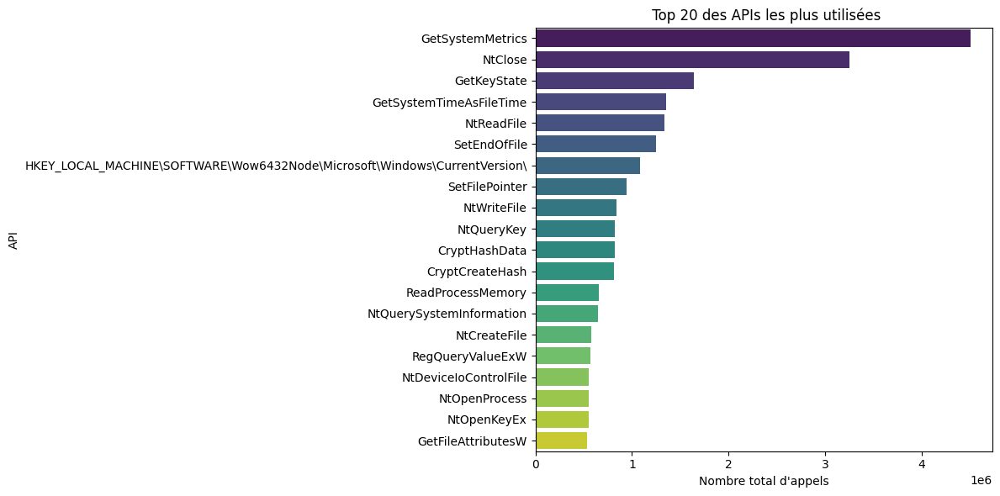

In [23]:
# Somme des appels par API
api_usage = df.drop(columns=['Sample_Type']).sum().sort_values(ascending=False).head(20)

# Affichage
plt.figure(figsize=(12,6))
sns.barplot(x=api_usage.values, y=api_usage.index, palette='viridis')
plt.title(" Top 20 des APIs les plus utilisées")
plt.xlabel("Nombre total d'appels")
plt.ylabel("API")
plt.tight_layout()
plt.show()


c:\Users\hp\miniconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


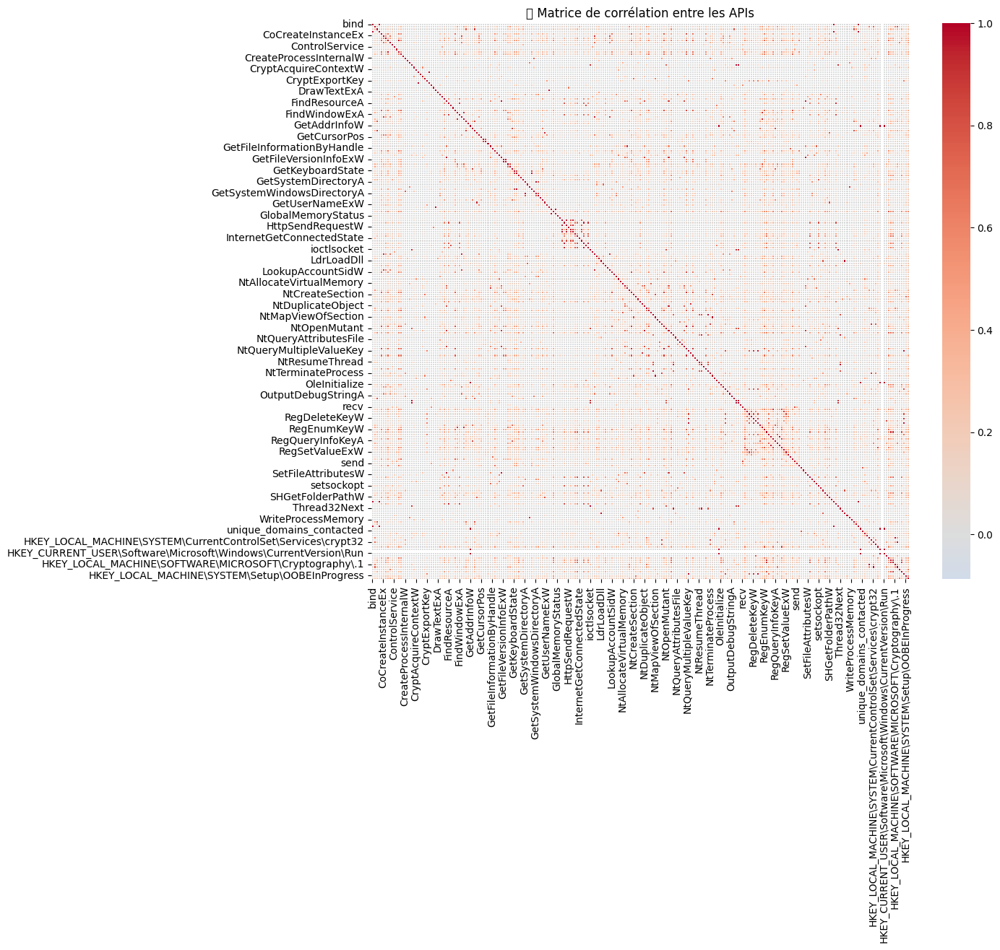

In [ ]:
# Calcul de la matrice de corrélation
correlation_matrix = df.drop(columns=['Sample_Type']).corr()

# Affichage de la heatmap
plt.figure(figsize=(12,10))
sns.heatmap(correlation_matrix, cmap='coolwarm', center=0, linewidths=0.5)
plt.title(" Matrice de corrélation entre les APIs")
plt.show()


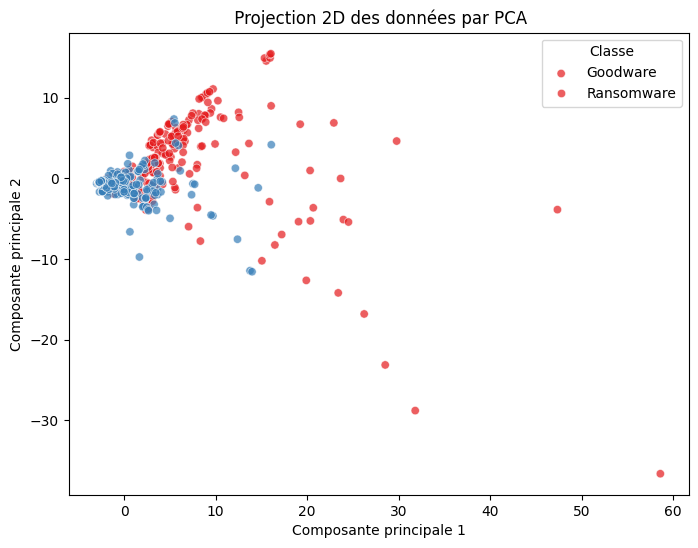

In [ ]:
# PCA pour visualisation 2D des données


from sklearn.decomposition import PCA

# Application de PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Affichage avec couleurs selon les classes
plt.figure(figsize=(8,6))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=y, palette='Set1', alpha=0.7)
plt.title(" Projection 2D des données par PCA")
plt.xlabel("Composante principale 1")
plt.ylabel("Composante principale 2")
plt.legend(title='Classe', labels=['Goodware', 'Ransomware'])
plt.show()


C:\Users\hp\AppData\Local\Temp\ipykernel_38684\3736471986.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='API', data=feat_importance, palette='rocket')
C:\Users\hp\AppData\Local\Temp\ipykernel_38684\3736471986.py:16: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  plt.tight_layout()
c:\Users\hp\miniconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


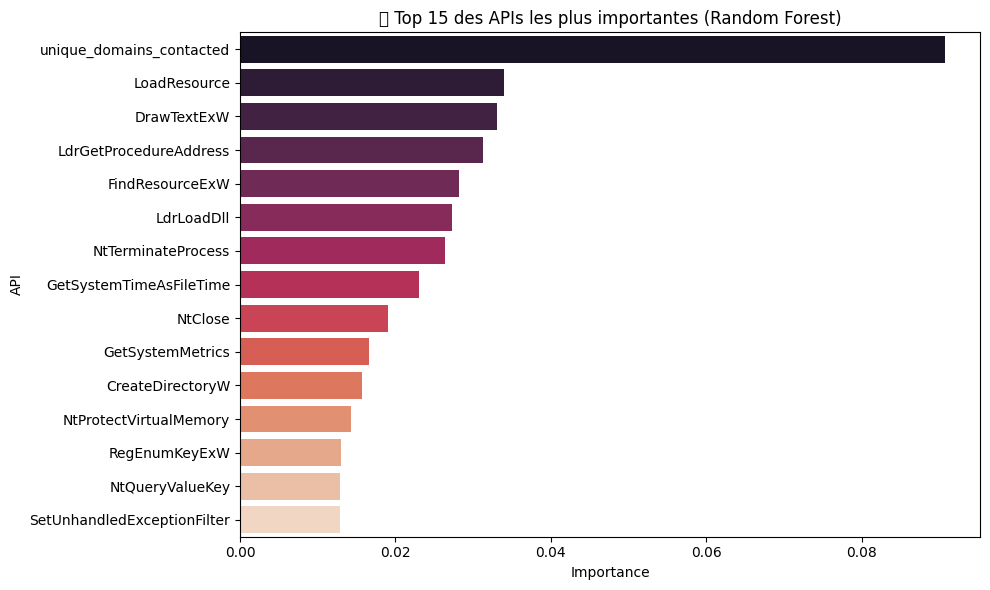

In [28]:
#Importance des features (API) selon Random Forest


# Récupérer les importances
importances = modele_rf.feature_importances_
features = X.columns

# Mise en DataFrame pour tri
feat_importance = pd.DataFrame({'API': features, 'Importance': importances})
feat_importance = feat_importance.sort_values(by='Importance', ascending=False).head(15)

# Affichage
plt.figure(figsize=(10,6))
sns.barplot(x='Importance', y='API', data=feat_importance, palette='rocket')
plt.title("🔥 Top 15 des APIs les plus importantes (Random Forest)")
plt.tight_layout()
plt.show()


# 🟡 Partie 2 : Pré-traitement

In [1]:
import pandas as pd

file_path = r'C:\Users\MOHSEN\Desktop\Ransomwares_Goodwares_Dataset.xlsx'
df = pd.read_excel(file_path, sheet_name='api_dataset_G')

print("✅ Données chargées")
print(df.head())  # Aperçu

✅ Données chargées
  Sample_Type  bind  CertControlStore  CertOpenStore  closesocket  \
0           G     0                 0              0            0   
1           G     0                 0              0            0   
2           G     0                13             56            0   
3           G     0                 0              0            0   
4           G     0                 0              0            0   

   CoCreateInstance  CoCreateInstanceEx  CoGetClassObject  CoInitializeEx  \
0                 0                   0                 0               1   
1                 0                   0                 0               0   
2                 0                   3                 0              28   
3                 0                   0                 0               1   
4                 0                   0                 0               0   

   CoInitializeSecurity  ...  \
0                     0  ...   
1                     0  ...   
2      

In [4]:
df = pd.read_excel(r'C:\Users\MOHSEN\Desktop\Ransomwares_Goodwares_Dataset.xlsx')
print(df)

     Sample_Type  bind  CertControlStore  CertOpenStore  closesocket  \
0              G     0                 0              0            0   
1              G     0                 0              0            0   
2              G     0                13             56            0   
3              G     0                 0              0            0   
4              G     0                 0              0            0   
...          ...   ...               ...            ...          ...   
1037           R     0                 0              0            0   
1038           R     0                 0              0            0   
1039           R     0                 0              0            0   
1040           R     0                 0              0            0   
1041           R     0                 0              0            0   

      CoCreateInstance  CoCreateInstanceEx  CoGetClassObject  CoInitializeEx  \
0                    0                   0             

In [5]:
print(df.to_string())

     Sample_Type  bind  CertControlStore  CertOpenStore  closesocket  CoCreateInstance  CoCreateInstanceEx  CoGetClassObject  CoInitializeEx  CoInitializeSecurity  connect  ControlService  CopyFileW  CoUninitialize  CreateActCtxW  CreateDirectoryW  CreateProcessInternalW  CreateRemoteThreadEx  CreateThread  CreateToolhelp32Snapshot  CryptAcquireContextA  CryptAcquireContextW  CryptCreateHash  CryptDecodeObjectEx  CryptDecrypt  CryptEncrypt  CryptExportKey  CryptHashData  DecryptMessage  DeleteFileW  DeviceIoControl  DrawTextExA  DrawTextExW  EnumServicesStatusW  EnumWindows  FindFirstFileExW  FindResourceA  FindResourceExA  FindResourceExW  FindResourceW  FindWindowA  FindWindowExA  FindWindowExW  FindWindowW  GetAdaptersAddresses  getaddrinfo  GetAddrInfoW  GetAsyncKeyState  GetBestInterfaceEx  GetComputerNameA  GetComputerNameW  GetCursorPos  GetDiskFreeSpaceExW  GetDiskFreeSpaceW  GetFileAttributesExW  GetFileAttributesW  GetFileInformationByHandle  GetFileInformationByHandleEx  Get

In [6]:
print(pd.options.display.max_rows)

60


In [10]:
pd.options.display.max_rows = 9999
df = pd.read_excel(r'C:\Users\MOHSEN\Desktop\Ransomwares_Goodwares_Dataset.xlsx')
print(df)

     Sample_Type  bind  CertControlStore  CertOpenStore  closesocket  \
0              G     0                 0              0            0   
1              G     0                 0              0            0   
2              G     0                13             56            0   
3              G     0                 0              0            0   
4              G     0                 0              0            0   
5              G     0                13             56            0   
6              G     0                 0              0            0   
7              G     0                 0              0            0   
8              G     0                 0              0            0   
9              G     0                 0              0            0   
10             G     0                 0              0            0   
11             G     0                 0              0            0   
12             G     0                 0              0         

In [14]:
print(df.head())

  Sample_Type  bind  CertControlStore  CertOpenStore  closesocket  \
0           G     0                 0              0            0   
1           G     0                 0              0            0   
2           G     0                13             56            0   
3           G     0                 0              0            0   
4           G     0                 0              0            0   

   CoCreateInstance  CoCreateInstanceEx  CoGetClassObject  CoInitializeEx  \
0                 0                   0                 0               1   
1                 0                   0                 0               0   
2                 0                   3                 0              28   
3                 0                   0                 0               1   
4                 0                   0                 0               0   

   CoInitializeSecurity  ...  \
0                     0  ...   
1                     0  ...   
2                     2  .

In [15]:
print(df.tail())

     Sample_Type  bind  CertControlStore  CertOpenStore  closesocket  \
1037           R     0                 0              0            0   
1038           R     0                 0              0            0   
1039           R     0                 0              0            0   
1040           R     0                 0              0            0   
1041           R     0                 0              0            0   

      CoCreateInstance  CoCreateInstanceEx  CoGetClassObject  CoInitializeEx  \
1037                 0                   0                 0               0   
1038                16                   5                 5               5   
1039                 0                   0                 0               0   
1040                 0                   0                 0               0   
1041                 1                   0                 0               2   

      CoInitializeSecurity  ...  \
1037                     0  ...   
1038            

In [12]:
#ANALYSE DE DONNEES

In [13]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1042 entries, 0 to 1041
Columns: 248 entries, Sample_Type to HKEY_LOCAL_MACHINE\SYSTEM\Setup\SystemSetupInProgress
dtypes: int64(247), object(1)
memory usage: 2.0+ MB
None


In [17]:
df = pd.read_excel(r'C:\Users\MOHSEN\Desktop\Ransomwares_Goodwares_Dataset.xlsx')
print(df.duplicated())

0       False
1       False
2       False
3       False
4        True
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16       True
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24       True
25       True
26      False
27       True
28      False
29       True
30      False
31       True
32       True
33       True
34       True
35      False
36       True
37      False
38       True
39      False
40      False
41       True
42      False
43       True
44       True
45       True
46       True
47       True
48       True
49       True
50      False
51       True
52       True
53       True
54       True
55       True
56      False
57      False
58      False
59      False
60       True
61       True
62      False
63       True
64       True
65      False
66       True
67       True
68       True
69       True
70      False
71    

In [18]:
df = pd.read_excel(r'C:\Users\MOHSEN\Desktop\Ransomwares_Goodwares_Dataset.xlsx')
nb_duplicatas = df.duplicated().sum()
print(f"🔁 Nombre de lignes dupliquées : {nb_duplicatas}")


🔁 Nombre de lignes dupliquées : 314


In [19]:
#afficher les lignes dupliques
duplicated_rows = df[df.duplicated()]
print(duplicated_rows)


     Sample_Type  bind  CertControlStore  CertOpenStore  closesocket  \
4              G     0                 0              0            0   
16             G     0                 0              0            0   
24             G     0                 0              0            0   
25             G     0                 0              0            0   
27             G     0                 0              0            0   
29             G     0                 0              0            0   
31             G     0                 0              0            0   
32             G     0                 0              0            0   
33             G     0                 0              0            0   
34             G     0                 0              0            0   
36             G     0                 0              0            0   
38             G     0                 0              0            0   
41             G     0                 0              0         

In [ ]:
#c pour supprimer les lignes dupplique
df_unique = df.drop_duplicates()
print(df_unique)


     Sample_Type  bind  CertControlStore  CertOpenStore  closesocket  \
0              G     0                 0              0            0   
1              G     0                 0              0            0   
2              G     0                13             56            0   
3              G     0                 0              0            0   
5              G     0                13             56            0   
6              G     0                 0              0            0   
7              G     0                 0              0            0   
8              G     0                 0              0            0   
9              G     0                 0              0            0   
10             G     0                 0              0            0   
11             G     0                 0              0            0   
12             G     0                 0              0            0   
13             G     0                 0              0         

In [24]:
print(df.isna().sum().sum())  # total des valeurs NaN
print(df_unique.duplicated().sum())  # total des lignes dupliquées restantes
print(df.dtypes)              # types des colonnes


0
0
Sample_Type                                                                        object
bind                                                                                int64
CertControlStore                                                                    int64
CertOpenStore                                                                       int64
closesocket                                                                         int64
CoCreateInstance                                                                    int64
CoCreateInstanceEx                                                                  int64
CoGetClassObject                                                                    int64
CoInitializeEx                                                                      int64
CoInitializeSecurity                                                                int64
connect                                                                             int64
Contro

In [9]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Charger et nettoyer le dataset
df = pd.read_excel(r'C:\Users\MOHSEN\Desktop\Ransomwares_Goodwares_Dataset.xlsx', sheet_name='api_dataset_G')
df_unique = df.drop_duplicates()

# Encodage du label
df_unique.loc[:, 'Sample_Type'] = df_unique['Sample_Type'].map({'G': 0, 'R': 1})

# Sélection des colonnes à normaliser
features = df_unique.drop(columns=['Sample_Type']).columns

# Normalisation
scaler = MinMaxScaler()
df_unique.loc[:, features] = scaler.fit_transform(df_unique[features])


C:\Users\MOHSEN\AppData\Local\Temp\ipykernel_16288\743114040.py:16: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.00392157 0.         0.         0.
 0.00392157 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.00392157 0.
 0.         0.         0.         0.         0.

In [14]:
print(df_unique.to_string())
print(df_unique.describe())


     Sample_Type      bind  CertControlStore  CertOpenStore  closesocket  CoCreateInstance  CoCreateInstanceEx  CoGetClassObject  CoInitializeEx  CoInitializeSecurity   connect  ControlService  CopyFileW  CoUninitialize  CreateActCtxW  CreateDirectoryW  CreateProcessInternalW  CreateRemoteThreadEx  CreateThread  CreateToolhelp32Snapshot  CryptAcquireContextA  CryptAcquireContextW  CryptCreateHash  CryptDecodeObjectEx  CryptDecrypt  CryptEncrypt  CryptExportKey  CryptHashData  DecryptMessage  DeleteFileW  DeviceIoControl  DrawTextExA  DrawTextExW  EnumServicesStatusW  EnumWindows  FindFirstFileExW  FindResourceA  FindResourceExA  FindResourceExW  FindResourceW  FindWindowA  FindWindowExA  FindWindowExW  FindWindowW  GetAdaptersAddresses  getaddrinfo  GetAddrInfoW  GetAsyncKeyState  GetBestInterfaceEx  GetComputerNameA  GetComputerNameW  GetCursorPos  GetDiskFreeSpaceExW  GetDiskFreeSpaceW  GetFileAttributesExW  GetFileAttributesW  GetFileInformationByHandle  GetFileInformationByHandleEx

In [18]:
df_unique.to_excel(r'C:\Users\MOHSEN\Downloads\df_unique_normalise.xlsx', index=False, engine='openpyxl')


In [22]:
print("📋 Colonnes réellement présentes :")
for col in df_unique.columns:
    print(f"- '{col}'")


📋 Colonnes réellement présentes :
- 'Sample_Type'
- 'bind'
- 'CertControlStore'
- 'CertOpenStore'
- 'closesocket'
- 'CoCreateInstance'
- 'CoCreateInstanceEx'
- 'CoGetClassObject'
- 'CoInitializeEx'
- 'CoInitializeSecurity'
- 'connect'
- 'ControlService'
- 'CopyFileW'
- 'CoUninitialize'
- 'CreateActCtxW'
- 'CreateDirectoryW'
- 'CreateProcessInternalW'
- 'CreateRemoteThreadEx'
- 'CreateThread'
- 'CreateToolhelp32Snapshot'
- 'CryptAcquireContextA'
- 'CryptAcquireContextW'
- 'CryptCreateHash'
- 'CryptDecodeObjectEx'
- 'CryptDecrypt'
- 'CryptEncrypt'
- 'CryptExportKey'
- 'CryptHashData'
- 'DecryptMessage'
- 'DeleteFileW'
- 'DeviceIoControl'
- 'DrawTextExA'
- 'DrawTextExW'
- 'EnumServicesStatusW'
- 'EnumWindows'
- 'FindFirstFileExW'
- 'FindResourceA'
- 'FindResourceExA'
- 'FindResourceExW'
- 'FindResourceW'
- 'FindWindowA'
- 'FindWindowExA'
- 'FindWindowExW'
- 'FindWindowW'
- 'GetAdaptersAddresses'
- 'getaddrinfo'
- 'GetAddrInfoW'
- 'GetAsyncKeyState'
- 'GetBestInterfaceEx'
- 'GetComputerNam

In [26]:
import pandas as pd

# Nettoyage des colonnes
df_unique.columns = df_unique.columns.str.strip()

# Forcer le type numérique de Sample_Type
df_unique['Sample_Type'] = pd.to_numeric(df_unique['Sample_Type'], errors='coerce')

# Colonne cible
cible = 'Sample_Type'

# Matrice de corrélation
cor_matrix = df_unique.corr(numeric_only=True)

# Vérification et affichage
if cible in cor_matrix.columns:
    correlations = cor_matrix[cible].sort_values(ascending=False)
    print(f"📊 Corrélation des colonnes avec : {cible}")
    print(correlations)
else:
    print(f"❌ La colonne '{cible}' n'est pas dans la matrice de corrélation.")
    print("Colonnes dans la matrice :", cor_matrix.columns.tolist())


📊 Corrélation des colonnes avec : Sample_Type
Sample_Type                                              1.000000
ransomware_signatures_detected                           0.286429
GetFileSizeEx                                            0.171720
CreateRemoteThreadEx                                     0.161784
MoveFileWithProgressW                                    0.160285
                                                           ...   
NtQueryKey                                              -0.366245
RegEnumKeyW                                             -0.374468
CoUninitialize                                          -0.406667
CoInitializeEx                                          -0.411975
HKEY_CURRENT_USER\Software\Microsoft\CommandProcessor         NaN
Name: Sample_Type, Length: 248, dtype: float64


C:\Users\MOHSEN\AppData\Local\Temp\ipykernel_16288\3777185050.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_unique['Sample_Type'] = pd.to_numeric(df_unique['Sample_Type'], errors='coerce')


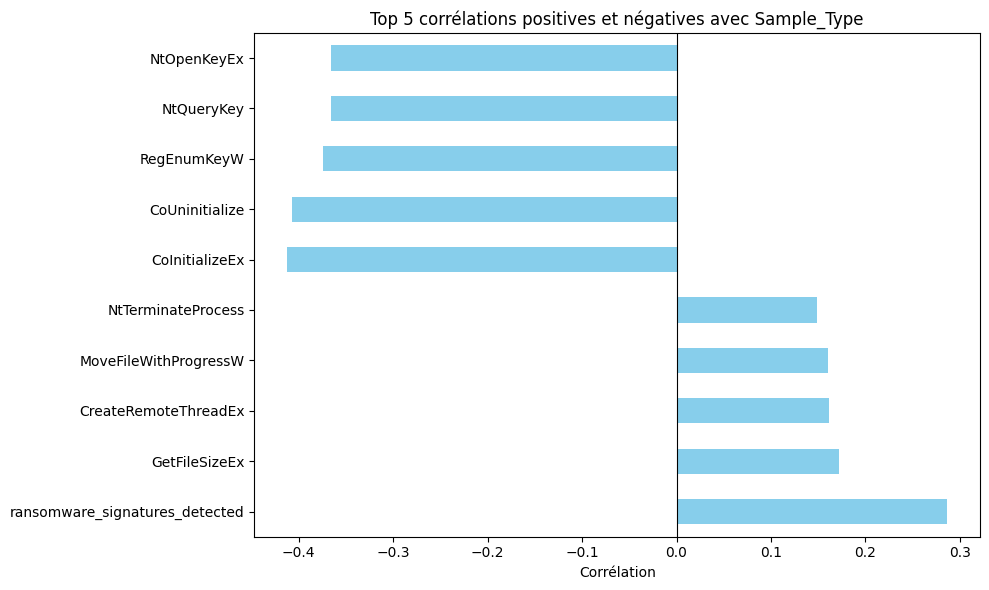

In [29]:
import matplotlib.pyplot as plt

# On retire la ligne "Sample_Type" lui-même (corrélation = 1.0)
correlations = correlations.drop(labels = 'Sample_Type'
)

# Séparer les top + et -
top_positive = correlations.sort_values(ascending=False).head(5)
top_negative = correlations.sort_values().head(5)

# Fusionner les deux
top_corr = pd.concat([top_positive, top_negative])

# Affichage graphique
plt.figure(figsize=(10, 6))
top_corr.plot(kind='barh', color='skyblue')
plt.title("Top 5 corrélations positives et négatives avec Sample_Type")
plt.xlabel("Corrélation")
plt.axvline(0, color='black', linewidth=0.8)
plt.tight_layout()
plt.show()


In [ ]:
top_corr.to_excel('top_correlations_sample_type.xlsx')


# 🔴 Partie 3 : Machine Learning Models

In [ ]:
import pandas as pd

# Charger le dataset nettoyé
df = pd.read_excel("df_unique_normalise.xlsx")

# Visualiser quelques lignes pour confirmer la structure
print(df.head())


   Sample_Type  bind  CertControlStore  CertOpenStore  closesocket  \
0            0   0.0          0.000000       0.000000          0.0   
1            0   0.0          0.000000       0.000000          0.0   
2            0   0.0          0.203125       0.090909          0.0   
3            0   0.0          0.000000       0.000000          0.0   
4            0   0.0          0.203125       0.090909          0.0   

   CoCreateInstance  CoCreateInstanceEx  CoGetClassObject  CoInitializeEx  \
0          0.000000            0.000000          0.000000        0.001379   
1          0.000000            0.000000          0.000000        0.000000   
2          0.000000            0.041096          0.000000        0.038621   
3          0.000000            0.000000          0.000000        0.001379   
4          0.508505            0.041096          0.051948        0.311724   

   CoInitializeSecurity  ...  \
0              0.000000  ...   
1              0.000000  ...   
2              0.027

In [ ]:
X = df.drop("Sample_Type", axis=1)
y = df["Sample_Type"]
print(X)
print(y)

         bind  CertControlStore  CertOpenStore  closesocket  CoCreateInstance  \
0    0.000000          0.000000       0.000000     0.000000          0.000000   
1    0.000000          0.000000       0.000000     0.000000          0.000000   
2    0.000000          0.203125       0.090909     0.000000          0.000000   
3    0.000000          0.000000       0.000000     0.000000          0.000000   
4    0.000000          0.203125       0.090909     0.000000          0.508505   
..        ...               ...            ...          ...               ...   
723  0.007843          0.000000       0.000000     0.007812          0.000000   
724  0.000000          0.000000       0.000000     0.000000          0.005372   
725  0.000000          0.000000       0.000000     0.000000          0.000000   
726  0.000000          0.000000       0.000000     0.000000          0.014324   
727  0.000000          0.000000       0.000000     0.000000          0.000895   

     CoCreateInstanceEx  Co

In [ ]:
from sklearn.model_selection import train_test_split

# Séparer en 80% train et 20% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train,"\n", X_test,"\n", y_train,"\n", y_test)


     bind  CertControlStore  CertOpenStore  closesocket  CoCreateInstance  \
433   0.0               0.0            0.0          0.0          0.000000   
136   0.0               0.0            0.0          0.0          0.000000   
350   0.0               0.0            0.0          0.0          0.042972   
6     0.0               0.0            0.0          0.0          0.000000   
318   0.0               0.0            0.0          0.0          0.000000   
..    ...               ...            ...          ...               ...   
71    0.0               0.0            0.0          0.0          0.000000   
106   0.0               0.0            0.0          0.0          0.424351   
270   0.0               0.0            0.0          0.0          0.000000   
435   0.0               0.0            0.0          0.0          0.000000   
102   0.0               0.0            0.0          0.0          0.000000   

     CoCreateInstanceEx  CoGetClassObject  CoInitializeEx  \
433           

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
# Pour SVM, nous utilisons les données standardisées
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)
print(X_train_scaled,"\n\n\n", X_test_scaled)

[[-0.09150636 -0.14036154 -0.12741265 ... -0.0655207  -0.58975454
  -0.5796078 ]
 [-0.09150636 -0.14036154 -0.12741265 ... -0.0655207  -0.58975454
  -0.5796078 ]
 [-0.09150636 -0.14036154 -0.12741265 ... -0.0655207   0.86258879
   0.16178064]
 ...
 [-0.09150636 -0.14036154 -0.12741265 ... -0.0655207  -0.58975454
  -0.5796078 ]
 [-0.09150636 -0.14036154 -0.12741265 ... -0.0655207   0.86258879
   0.16178064]
 [-0.09150636 -0.14036154 -0.12741265 ... -0.0655207  -0.58975454
  -0.5796078 ]] 


 [[-0.09150636 -0.14036154 -0.12741265 ... -0.0655207  -0.58975454
  -0.5796078 ]
 [-0.09150636 -0.14036154 -0.12741265 ... -0.0655207   0.86258879
   0.90316908]
 [-0.09150636 -0.14036154 -0.12741265 ... -0.0655207  -0.58975454
  -0.5796078 ]
 ...
 [-0.09150636 -0.14036154 -0.12741265 ... -0.0655207  -0.58975454
  -0.5796078 ]
 [-0.09150636 -0.14036154 -0.12741265 ... -0.0655207  -0.58975454
   0.16178064]
 [-0.09150636 -0.14036154 -0.12741265 ... -0.0655207  -0.58975454
  -0.5796078 ]]


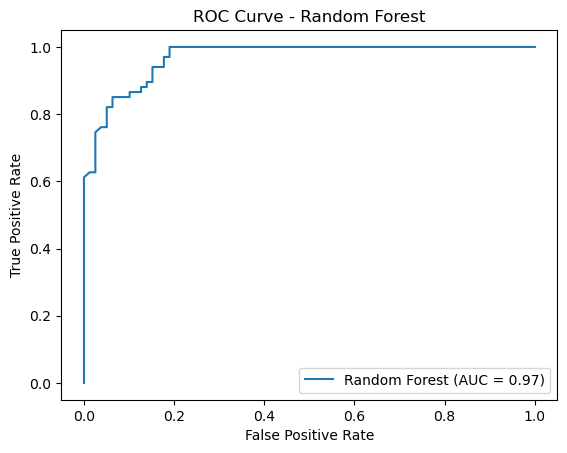

Random Forest - Accuracy: 0.8767123287671232
Random Forest - F1 Score: 0.8636363636363636
Random Forest - Confusion Matrix:
 [[71  8]
 [10 57]]


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Créer et entrainer le modèle Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Prédictions sur le jeu de test
predictions_rf = rf.predict(X_test)

# Évaluation : précision, F1 et matrice de confusion
accuracy_rf = accuracy_score(y_test, predictions_rf)
f1_rf = f1_score(y_test, predictions_rf)
cm_rf = confusion_matrix(y_test, predictions_rf)

# Evaluation ROC : obtenir les probabilités pour la classe positive
probabilities_rf = rf.predict_proba(X_test)[:, 1]
roc_auc_rf = roc_auc_score(y_test, probabilities_rf)
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, probabilities_rf)

# Affichage de la courbe ROC
plt.figure()
plt.plot(fpr_rf, tpr_rf, label='Random Forest (AUC = {:.2f})'.format(roc_auc_rf))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Random Forest')
plt.legend(loc='lower right')
plt.show()

# Afficher les scores
print("Random Forest - Accuracy:", accuracy_rf)
print("Random Forest - F1 Score:", f1_rf)
print("Random Forest - Confusion Matrix:\n", cm_rf)


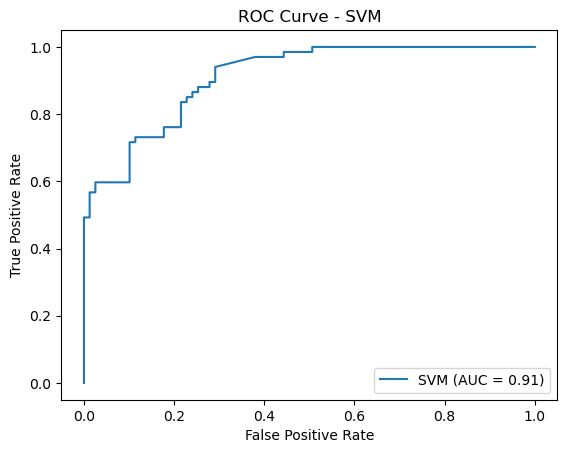

SVM - Accuracy: 0.7191780821917808
SVM - F1 Score: 0.7657142857142857
SVM - Confusion Matrix:
 [[38 41]
 [ 0 67]]


In [ ]:
from sklearn.svm import SVC

# Créer et entrainer le modèle SVM (avec probability=True pour calculer les probabilités)
svm_clf = SVC(probability=True, random_state=42)
svm_clf.fit(X_train_scaled, y_train)

# Prédictions sur le jeu de test
predictions_svm = svm_clf.predict(X_test_scaled)

# Évaluation : précision, F1 et matrice de confusion
accuracy_svm = accuracy_score(y_test, predictions_svm)
f1_svm = f1_score(y_test, predictions_svm)
cm_svm = confusion_matrix(y_test, predictions_svm)

# Evaluation ROC : obtenir les probabilités pour la classe positive
probabilities_svm = svm_clf.predict_proba(X_test_scaled)[:, 1]
roc_auc_svm = roc_auc_score(y_test, probabilities_svm)
fpr_svm, tpr_svm, thresholds_svm = roc_curve(y_test, probabilities_svm)

# Affichage de la courbe ROC
plt.figure()
plt.plot(fpr_svm, tpr_svm, label='SVM (AUC = {:.2f})'.format(roc_auc_svm))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - SVM')
plt.legend(loc='lower right')
plt.show()

# Afficher les scores
print("SVM - Accuracy:", accuracy_svm)
print("SVM - F1 Score:", f1_svm)
print("SVM - Confusion Matrix:\n", cm_svm)


# 🔴 Partie 4 : Deep Learning

In [ ]:
# Cellule 1
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Cellule 2
# Charger le fichier Excel nettoyé
df = pd.read_excel("clean.xlsx")

# Afficher les premières lignes
print("Aperçu du dataset nettoyé :")
df.head()

Aperçu du dataset nettoyé :


,Sample_Type,bind,CertControlStore,CertOpenStore,closesocket,CoCreateInstance,CoCreateInstanceEx,CoGetClassObject,CoInitializeEx,CoInitializeSecurity,...,HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Policies\Explorer\,HKEY_CURRENT_USER\Software\Microsoft\Windows\CurrentVersion\Internet Settings\,HKEY_LOCAL_MACHINE\Software\Microsoft\Windows\CurrentVersion\Internet Settings\,HKEY_LOCAL_MACHINE\SOFTWARE\MICROSOFT\Cryptography\.1,HKEY_LOCAL_MACHINE\SYSTEM\ControlSet001\services\crypt32\,HKEY_LOCAL_MACHINE\SYSTEM\ControlSet001\services\Tcpip\Parameters\,HKEY_LOCAL_MACHINE\Software\Microsoft\Rpc\,HKEY_CURRENT_USER\Software\Microsoft\RestartManager,HKEY_LOCAL_MACHINE\SYSTEM\Setup\OOBEInProgress,HKEY_LOCAL_MACHINE\SYSTEM\Setup\SystemSetupInProgress
0,0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.001379,0.000000,...,0.062500,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
1,0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
2,0,0.0,0.203125,0.090909,0.0,0.000000,0.041096,0.000000,0.038621,0.027778,...,0.090278,0.031505,0.0,0.031001,0.425197,0.008704,0.0,0.0,0.0,0.063830
3,0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.001379,0.000000,...,0.062500,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
4,0,0.0,0.203125,0.090909,0.0,0.508505,0.041096,0.051948,0.311724,0.027778,...,0.114583,0.031505,0.0,0.040218,0.425197,0.013540,0.0,0.0,0.0,0.106383


In [ ]:
# Séparer features (X) et labels (y)
X = df.drop('Sample_Type', axis=1)  # Utiliser 'Sample_Type' comme nom de la colonne label
y = df['Sample_Type']

# Split train/test (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Vérifier les dimensions
print(f"X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")


X_train shape: (582, 247), X_test shape: (146, 247)


In [ ]:
# Cellule 4
# Initialiser le modèle
model = Sequential()

# Ajouter des couches
model.add(Dense(128, input_dim=X_train.shape[1], activation='relu'))  # Couche d'entrée + 1ère couche cachée
model.add(Dropout(0.3))  # Pour réduire l'overfitting
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(1, activation='sigmoid'))  # Couche de sortie (classification binaire)

# Compiler le modèle
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Résumé du modèle
model.summary()

c:\Users\Achraf Alaabouch\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │        31,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 40,065 (156.50 KB)

 Trainable params: 40,065 (156.50 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Cellule 5
# Entraînement avec sauvegarde de l'historique
history = model.fit(
    X_train, y_train,
    validation_split=0.2,  # 20% des données d'entraînement pour la validation
    epochs=50,
    batch_size=32,
    verbose=1
)

Epoch 1/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5771 - loss: 0.6848 - val_accuracy: 0.7350 - val_loss: 0.6575
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7265 - loss: 0.6433 - val_accuracy: 0.7692 - val_loss: 0.5909
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7794 - loss: 0.5704 - val_accuracy: 0.7607 - val_loss: 0.5201
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7865 - loss: 0.4978 - val_accuracy: 0.7692 - val_loss: 0.4667
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8045 - loss: 0.4359 - val_accuracy: 0.7778 - val_loss: 0.4299
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8333 - loss: 0.3816 - val_accuracy: 0.8034 - val_loss: 0.4136
Epoch 7/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8306 - loss: 0.3603 - val_accuracy: 0.8205 - val_loss: 0.4080
Epoch 8/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8260 - loss: 0.3460 - val_accuracy: 0.8120 - val_loss

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


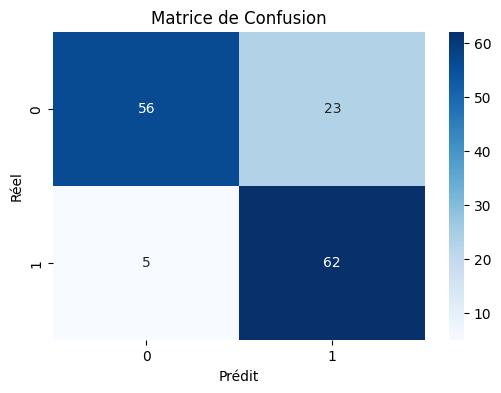


Rapport de classification :
                precision    recall  f1-score   support

  Goodware (G)       0.92      0.71      0.80        79
Ransomware (R)       0.73      0.93      0.82        67

      accuracy                           0.81       146
     macro avg       0.82      0.82      0.81       146
  weighted avg       0.83      0.81      0.81       146



In [ ]:
# Cellule 6
# Prédire sur les données de test
y_pred = model.predict(X_test)
y_pred_classes = np.round(y_pred).flatten()

# Matrice de confusion
plt.figure(figsize=(6,4))
sns.heatmap(confusion_matrix(y_test, y_pred_classes), annot=True, fmt='d', cmap='Blues')
plt.title('Matrice de Confusion')
plt.xlabel('Prédit')
plt.ylabel('Réel')
plt.show()

# Rapport de classification
print("\nRapport de classification :")
print(classification_report(y_test, y_pred_classes, target_names=['Goodware (G)', 'Ransomware (R)']))

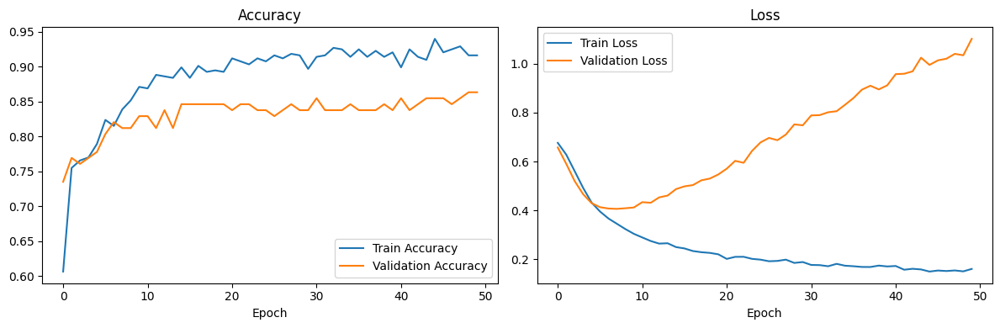

In [ ]:
# Cellule 7
# Courbes d'accuracy et de loss
plt.figure(figsize=(12, 4))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Cellule 8
# Sauvegarder le modèle pour une réutilisation future
model.save('ransomware_mlp_model.h5')
print("Modèle sauvegardé avec succès !")

Modèle sauvegardé avec succès !


In [ ]:
# Cellule 9 (optionnelle pour démo)
from tensorflow.keras.models import load_model

# Charger le modèle sauvegardé
loaded_model = load_model('ransomware_mlp_model.h5')

# Vérifier l'architecture
loaded_model.summary()

# Exemple de prédiction
sample_data = X_test.iloc[[0]]  # Première ligne du test set
prediction = loaded_model.predict(sample_data)
print(f"Prédiction : {prediction} (0 = Goodware, 1 = Ransomware)")

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │        31,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 40,067 (156.52 KB)

 Trainable params: 40,065 (156.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Prédiction : [[0.55401516]] (0 = Goodware, 1 = Ransomware)


In [ ]:
# Sauvegarder le modèle pour une réutilisation future
model.save('ransomware_mlp_model.h5')
print("Modèle sauvegardé avec succès !")

# Vérification du fichier sauvegardé
import os
if os.path.exists('ransomware_mlp_model.h5'):
    print("Le fichier du modèle a bien été sauvegardé !")
else:
    print("Erreur lors de la sauvegarde du modèle.")


Modèle sauvegardé avec succès !
Le fichier du modèle a bien été sauvegardé !


In [ ]:
from tensorflow.keras.models import load_model

# Charger le modèle sauvegardé
loaded_model = load_model('ransomware_mlp_model.h5')
print("Modèle chargé avec succès !")

# Utilisation du modèle chargé (par exemple, pour prédire sur de nouvelles données)
predictions = loaded_model.predict(X_test)
print(predictions)


Modèle chargé avec succès !
1/5 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/stepWARNING:tensorflow:5 out of the last 11 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x0000023B65A56A70> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
[[5.5401510e-01]
 [7.1507666e-09]
 [4.4744056e-02]
 [9.9999517e-01]
 [3.9601319e-02]
 [3.3667258e-03]
 [9.9991846e-01]
 [9.9884439e-01]
 [1.8336274e-31]
 [4.1520827e-02]
 [1.0000000e+00]
 [5.0087515e-08]
 [9.3591271e-04]
 [1.0000000e+00]
 [9.9877447e-01]
 [1.0000000e+00]
 [8.8753438e-01]
 [7.2234980e-05]
 [8.4581906e-01]
 [5.7791519e-01]
 [8.3887711e-02]
 [9.9999708e-01]
 [4.7712176e-04]
 [5.7789075e-01]
 [9.9950075e-01]
 [5.6265972e-06]
 [5.3247705e-02]
 [9.6632946e-01]
 [5.9125948e-01]
 [3.5032770e-03]
 [9.9735993e-01]
 [5.4515696e-01]
 [2.5045621e-04]
 [1.0000000e+00]
 [1.7958724e-08]
 [5.0185807e-03]
 [4.3782026e-02]
 [9.9892426e-01]
 [9.9999475e-01]
 [9.9999845e-01]
 [8.4750205e-01]
 [2.5419833e-04]
 [5.7790124e-01]
 [9.9997234e-01]
 [1.0000000e+00]
 [5.7719845e-01]
 [9.6632957e-01]
 [1.0000000e+00]
 [1.0507693e-01]
 [5.5625457e-01]
 [8.3614282e-10]
 [6.9764590e-01]
 [5.4531946e-04]
 [1.6996200e-12]
 [2.8508070e-03]
 [5.7591635e-01]
 [7.168313

In [ ]:
from tensorflow.keras.models import load_model

# Charger le modèle depuis le fichier .h5
model = load_model('ransomware_mlp_model.h5')

# Afficher la structure du modèle (architecture)
model.summary()

# Afficher les noms des couches du modèle
print("Couches du modèle :")
for layer in model.layers:
    print(layer.name)

# Si tu veux inspecter les poids d'une couche spécifique
weights = model.get_weights()
print("Poids du modèle (premiers poids) :")
print(weights[0])  # Affiche les poids de la première couche


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │        31,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 40,067 (156.52 KB)

 Trainable params: 40,065 (156.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

Couches du modèle :
dense
dropout
dense_1
dropout_1
dense_2
Poids du modèle (premiers poids) :
[[-0.10796171  0.2516721   0.07425136 ... -0.15643382 -0.09387722
  -0.06414049]
 [-0.03935949 -0.11994078 -0.16085123 ...  0.07822119 -0.00549236
  -0.01786049]
 [-0.0982319   0.00870907 -0.0765304  ...  0.21635637 -0.14757137
   0.14221066]
 ...
 [ 0.27153632  0.3265295  -0.05903687 ... -0.07751006 -0.00438164
  -0.07074392]
 [ 0.10858331 -0.04966305  0.10295922 ...  0.09259572  0.15415524
  -0.05727851]
 [-0.07512628 -0.07414624 -0.09989571 ...  0.00140675  0.02716952
   0.14006408]]


In [ ]:
# Exemple de prédiction sur une donnée test
sample = X_test.iloc[0:1]  # Première ligne du test set
prediction = model.predict(sample)
print(f"Prédiction : {prediction[0][0]:.2f} (0=G, 1=R)")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
Prédiction : 0.55 (0=G, 1=R)
